<a href="https://colab.research.google.com/github/ipeirotis-org/datasets/blob/main/Collisions/NY_Collisions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -q google-cloud-secret-manager

from google.colab import auth
auth.authenticate_user()

from google.cloud import secretmanager

def access_secret_version(project_id, secret_id, version_id):
    """
    Access the payload of the given secret version and return it.

    Args:
        project_id (str): Google Cloud project ID.
        secret_id (str): ID of the secret to access.
        version_id (str): ID of the version to access.
    Returns:
        str: The secret version's payload, or None if
        the version does not exist.
    """
    client = secretmanager.SecretManagerServiceClient()
    name = f"projects/{project_id}/secrets/{secret_id}/versions/{version_id}"
    response = client.access_secret_version(request={"name": name})
    return response.payload.data.decode("UTF-8")


mysql_pass = access_secret_version("nyu-datasets", "MYSQL_PASSWORD", "latest")

In [3]:
# !sudo apt-get update
# !sudo apt-get install python3-rtree
# !sudo pip3 install geopandas descartes shapely ngram # matplotlib==3.1.3

In [4]:
from datetime import datetime

t_start = datetime.now()

t_start

datetime.datetime(2025, 6, 6, 19, 50, 1, 548794)

In [5]:
# Render our plots inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [152]:
!curl 'https://data.cityofnewyork.us/api/views/h9gi-nx95/rows.csv?accessType=DOWNLOAD' -o accidents.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  438M    0  438M    0     0  4071k      0 --:--:--  0:01:50 --:--:-- 2770k


In [153]:
import pandas as pd
import geopandas as gpd

df = pd.read_csv("accidents.csv", low_memory=False, dtype='object')


In [154]:
df.dtypes

,0
CRASH DATE,object
CRASH TIME,object
BOROUGH,object
ZIP CODE,object
LATITUDE,object
LONGITUDE,object
LOCATION,object
ON STREET NAME,object
CROSS STREET NAME,object
OFF STREET NAME,object


In [155]:
df = df.rename(
    {
    "COLLISION_ID": "UNIQUE_KEY",
    "ZIP CODE" : 'ZIPCODE',
    "NUMBER OF PERSONS INJURED": "PERSONS_INJURED",
    "NUMBER OF PERSONS KILLED": "PERSONS_KILLED",
    "NUMBER OF PEDESTRIANS INJURED": "PEDESTRIANS_INJURED",
    "NUMBER OF PEDESTRIANS KILLED": "PEDESTRIANS_KILLED",
    'NUMBER OF MOTORIST INJURED': 'MOTORISTS_INJURED',
    'NUMBER OF MOTORIST KILLED': 'MOTORISTS_KILLED',
    'NUMBER OF CYCLIST INJURED': 'CYCLISTS_INJURED',
    'NUMBER OF CYCLIST KILLED': 'CYCLISTS_KILLED',
    'CONTRIBUTING FACTOR VEHICLE 1': 'CAUSE_VEHICLE_1',
    'CONTRIBUTING FACTOR VEHICLE 2': 'CAUSE_VEHICLE_2',
    'CONTRIBUTING FACTOR VEHICLE 3': 'CAUSE_VEHICLE_3',
    'CONTRIBUTING FACTOR VEHICLE 4': 'CAUSE_VEHICLE_4',
    'CONTRIBUTING FACTOR VEHICLE 5': 'CAUSE_VEHICLE_5',
    'VEHICLE TYPE CODE 1': 'TYPE_VEHICLE_1',
    'VEHICLE TYPE CODE 2': 'TYPE_VEHICLE_2',
    'VEHICLE TYPE CODE 3': 'TYPE_VEHICLE_3',
    'VEHICLE TYPE CODE 4': 'TYPE_VEHICLE_4',
    'VEHICLE TYPE CODE 5': 'TYPE_VEHICLE_5',
    },
    axis = 'columns',
)

In [159]:
# df.ZIPCODE.str.len().max()

5.0

In [160]:
cols = df.columns
cols = cols.map(lambda x: x.replace(' ', '_'))
df.columns = cols

In [161]:
df['DATE_TIME'] = df['CRASH_DATE'] + ' ' + df['CRASH_TIME']
df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'], format="%m/%d/%Y %H:%M")

In [162]:
df.dtypes

,0
CRASH_DATE,object
CRASH_TIME,object
BOROUGH,object
ZIPCODE,object
LATITUDE,object
LONGITUDE,object
LOCATION,object
ON_STREET_NAME,object
CROSS_STREET_NAME,object
OFF_STREET_NAME,object


In [13]:
!rm accidents.csv

In [163]:
cols = [
    'UNIQUE_KEY',
    'DATE_TIME',
    'BOROUGH',
    'ZIPCODE',
    'LATITUDE',
    'LONGITUDE',
    'LOCATION',
    'ON_STREET_NAME',
    'CROSS_STREET_NAME',
    'OFF_STREET_NAME',
    'PERSONS_INJURED',
    'PERSONS_KILLED',
    'PEDESTRIANS_INJURED',
    'PEDESTRIANS_KILLED',
    'CYCLISTS_INJURED',
    'CYCLISTS_KILLED',
    'MOTORISTS_INJURED',
    'MOTORISTS_KILLED',
    'CAUSE_VEHICLE_1',
    'CAUSE_VEHICLE_2',
    'CAUSE_VEHICLE_3',
    'CAUSE_VEHICLE_4',
    'CAUSE_VEHICLE_5',
    'TYPE_VEHICLE_1',
    'TYPE_VEHICLE_2',
    'TYPE_VEHICLE_3',
    'TYPE_VEHICLE_4',
    'TYPE_VEHICLE_5',
]

df = df[cols].copy()

In [164]:
df.dtypes

,0
UNIQUE_KEY,object
DATE_TIME,datetime64[ns]
BOROUGH,object
ZIPCODE,object
LATITUDE,object
LONGITUDE,object
LOCATION,object
ON_STREET_NAME,object
CROSS_STREET_NAME,object
OFF_STREET_NAME,object


## Analysis of Data Types

In [165]:
df.UNIQUE_KEY = df.UNIQUE_KEY.str.zfill(7)

### Datetime

<Axes: >

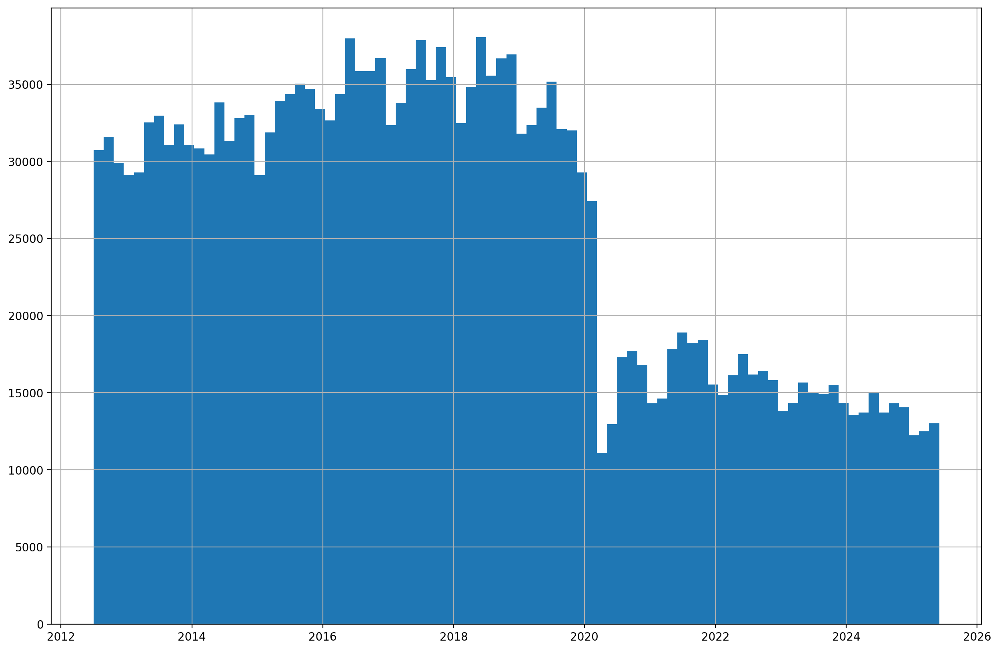

In [166]:
df['DATE_TIME'].hist(bins=7*12, figsize=(15,10))

In [18]:
# df = df.drop( ['DATE','TIME'], axis='columns')

### Borough

In [167]:
df['BOROUGH'] = pd.Categorical(df.BOROUGH)

In [168]:
df['BOROUGH'].value_counts()

,count
BOROUGH,
BROOKLYN,482411
QUEENS,404439
MANHATTAN,335100
BRONX,223413
STATEN ISLAND,63210


In [169]:
sum(~df['BOROUGH'].isnull())

1508573

In [170]:
# Significant number of missing values
# We will fix later, by joining with the NYC neighborhood shapefile
sum(df['BOROUGH'].isnull())

672650

### Zip Code

In [171]:
df['ZIPCODE'] = pd.Categorical(df['ZIPCODE'])

In [172]:
# Significant number of missing values
# We will fix later, by joining with the NYC ZIP shapefile
sum(df['ZIPCODE'].isnull())

672919

In [25]:
# We will get back to these columns with geo-shapefiles

In [174]:
df['ZIPCODE'].str.len().value_counts()

,count
ZIPCODE,
5.0,1508304


### Longitute and Latitude

In [175]:
df.LATITUDE = pd.to_numeric(df.LATITUDE)
df.LONGITUDE  = pd.to_numeric(df.LONGITUDE)

In [176]:
sum(df['LATITUDE'].isnull() | df['LONGITUDE'].isnull())

239998

In [177]:
df['LATITUDE'] = df['LATITUDE'].fillna(0.0)
df['LONGITUDE'] = df['LONGITUDE'].fillna(0.0)

# We keep LOCATION (which is largely redundant), just to make easy
# analysis of errors later on.
df.LOCATION = '(' + df.LATITUDE.astype(float).astype(str) + ', ' + df.LONGITUDE.astype(float).astype(str) + ')'

# This is just lon/lat combined, we could drop it, but we will drop it later

### Numeric Fields

In [29]:
# df['UNIQUE_KEY'] = pd.to_numeric(df['UNIQUE_KEY'], downcast='unsigned')

In [179]:
df['PERSONS_INJURED'] = df['PERSONS_INJURED'].fillna(0)
df['PERSONS_INJURED'] = pd.to_numeric(df['PERSONS_INJURED'], downcast='unsigned')

In [180]:
df['PERSONS_KILLED'] = df['PERSONS_KILLED'].fillna(0)
df['PERSONS_KILLED']  = pd.to_numeric(df['PERSONS_KILLED'], downcast='unsigned')

In [181]:
df['PEDESTRIANS_INJURED'] = df['PEDESTRIANS_INJURED'].fillna(0)
df['PEDESTRIANS_INJURED'] = pd.to_numeric(df['PEDESTRIANS_INJURED'], downcast='unsigned')

In [182]:
df['PEDESTRIANS_KILLED'] = df['PEDESTRIANS_KILLED'].fillna(0)
df['PEDESTRIANS_KILLED'] = pd.to_numeric(df['PEDESTRIANS_KILLED'], downcast='unsigned')

In [183]:
df['CYCLISTS_INJURED'] = df['CYCLISTS_INJURED'].fillna(0)
df['CYCLISTS_INJURED'] = pd.to_numeric(df['CYCLISTS_INJURED'], downcast='unsigned')

In [184]:
df['CYCLISTS_KILLED'] = df['CYCLISTS_KILLED'].fillna(0)
df['CYCLISTS_KILLED'] = pd.to_numeric(df['CYCLISTS_KILLED'], downcast='unsigned')

In [185]:
df['MOTORISTS_INJURED'] = df['MOTORISTS_INJURED'].fillna(0)
df['MOTORISTS_INJURED'] = pd.to_numeric(df['MOTORISTS_INJURED'], downcast='unsigned')

In [186]:
df['MOTORISTS_KILLED'] = df['MOTORISTS_KILLED'].fillna(0)
df['MOTORISTS_KILLED'] = pd.to_numeric(df['MOTORISTS_KILLED'], downcast='unsigned')

## Normalizing Causes and Types

In [187]:
df['CAUSE_VEHICLE_1'] = pd.Categorical(df['CAUSE_VEHICLE_1'].str.upper())
df['CAUSE_VEHICLE_2'] = pd.Categorical(df['CAUSE_VEHICLE_2'].str.upper())
df['CAUSE_VEHICLE_3'] = pd.Categorical(df['CAUSE_VEHICLE_3'].str.upper())
df['CAUSE_VEHICLE_4'] = pd.Categorical(df['CAUSE_VEHICLE_4'].str.upper())
df['CAUSE_VEHICLE_5'] = pd.Categorical(df['CAUSE_VEHICLE_5'].str.upper())
df['TYPE_VEHICLE_1'] = pd.Categorical(df['TYPE_VEHICLE_1'].str.upper())
df['TYPE_VEHICLE_2'] = pd.Categorical(df['TYPE_VEHICLE_2'].str.upper())
df['TYPE_VEHICLE_3'] = pd.Categorical(df['TYPE_VEHICLE_3'].str.upper())
df['TYPE_VEHICLE_4'] = pd.Categorical(df['TYPE_VEHICLE_4'].str.upper())
df['TYPE_VEHICLE_5'] = pd.Categorical(df['TYPE_VEHICLE_5'].str.upper())


In [188]:
import numpy as np
df1 = df[['UNIQUE_KEY', 'CAUSE_VEHICLE_1', 'TYPE_VEHICLE_1']].copy()
df1['VEHICLE'] = 1
df1.columns = ['UNIQUE_KEY', 'CAUSE', 'VEHICLE_TYPE', 'VEHICLE']

df2 = df[['UNIQUE_KEY', 'CAUSE_VEHICLE_2', 'TYPE_VEHICLE_2']].copy()
df2['VEHICLE'] = 2
df2.columns = ['UNIQUE_KEY', 'CAUSE', 'VEHICLE_TYPE', 'VEHICLE']

df3 = df[['UNIQUE_KEY', 'CAUSE_VEHICLE_3', 'TYPE_VEHICLE_3']].copy()
df3['VEHICLE'] = 3
df3.columns = ['UNIQUE_KEY', 'CAUSE', 'VEHICLE_TYPE', 'VEHICLE']

df4 = df[['UNIQUE_KEY', 'CAUSE_VEHICLE_4', 'TYPE_VEHICLE_4']].copy()
df4['VEHICLE'] = 4
df4.columns = ['UNIQUE_KEY', 'CAUSE', 'VEHICLE_TYPE', 'VEHICLE']

df5 = df[['UNIQUE_KEY', 'CAUSE_VEHICLE_5', 'TYPE_VEHICLE_5']].copy()
df5['VEHICLE'] = 5
df5.columns = ['UNIQUE_KEY', 'CAUSE', 'VEHICLE_TYPE', 'VEHICLE']



In [189]:
concat_df = [df1, df2, df3, df4, df5]
ct_df = pd.concat(concat_df)
ct_df = ct_df.set_index('UNIQUE_KEY')
ct_df = ct_df.sort_values(['UNIQUE_KEY', 'VEHICLE'])
ct_df = ct_df.dropna()

In [41]:
# ct_df['CAUSE'] = pd.Categorical(ct_df['CAUSE'])
# ct_df['VEHICLE_TYPE'] = pd.Categorical(ct_df['VEHICLE_TYPE'])
# ct_df['VEHICLE'] = pd.Categorical(ct_df['VEHICLE'])

In [190]:
# Since we have the ct_df ("causes/types dataframe") we can drop these columns
# from the main dataframe
todrop = [
    'CAUSE_VEHICLE_1', 'TYPE_VEHICLE_1',
    'CAUSE_VEHICLE_2', 'TYPE_VEHICLE_2',
    'CAUSE_VEHICLE_3', 'TYPE_VEHICLE_3',
    'CAUSE_VEHICLE_4', 'TYPE_VEHICLE_4',
    'CAUSE_VEHICLE_5', 'TYPE_VEHICLE_5'
]
df = df.drop(todrop, axis='columns')

## Detecting Inconsistencies

In [191]:
# Incorrect number for injured people
check = (df.PEDESTRIANS_INJURED + df.CYCLISTS_INJURED + df.MOTORISTS_INJURED != df.PERSONS_INJURED)
incorrect_injured = set(df[check].UNIQUE_KEY.values)
len(incorrect_injured)

9570

In [192]:
# Incorrect number of people killed
check = ( df.PEDESTRIANS_KILLED + df.CYCLISTS_KILLED + df.MOTORISTS_KILLED != df.PERSONS_KILLED)
incorrect_killed = set(df[check].UNIQUE_KEY.values)
len(incorrect_killed)

73

In [193]:
# No entries for vehicle/cause
nocause = set(df.UNIQUE_KEY.values) -set(ct_df.index.values)
len(nocause)

18449

In [194]:
# Incorrect number of entries for vehicle types/causes
dd1 = ct_df[['VEHICLE']].groupby('UNIQUE_KEY').count() # number of vehicles involved
dd2 = ct_df[['VEHICLE']].groupby('UNIQUE_KEY').max() # higher number of VEHICLE_NUM
j = dd1.merge(dd2, left_index=True, right_index=True)
j.columns = ['cnt', 'max']
# j.query("cnt != max")

incorrect_vehicles = set(j[j['max'] != j['cnt']].index.values)
len(incorrect_vehicles)

11

In [195]:
todelete = incorrect_injured | incorrect_killed | nocause | incorrect_vehicles

<Axes: xlabel='DATE_TIME'>

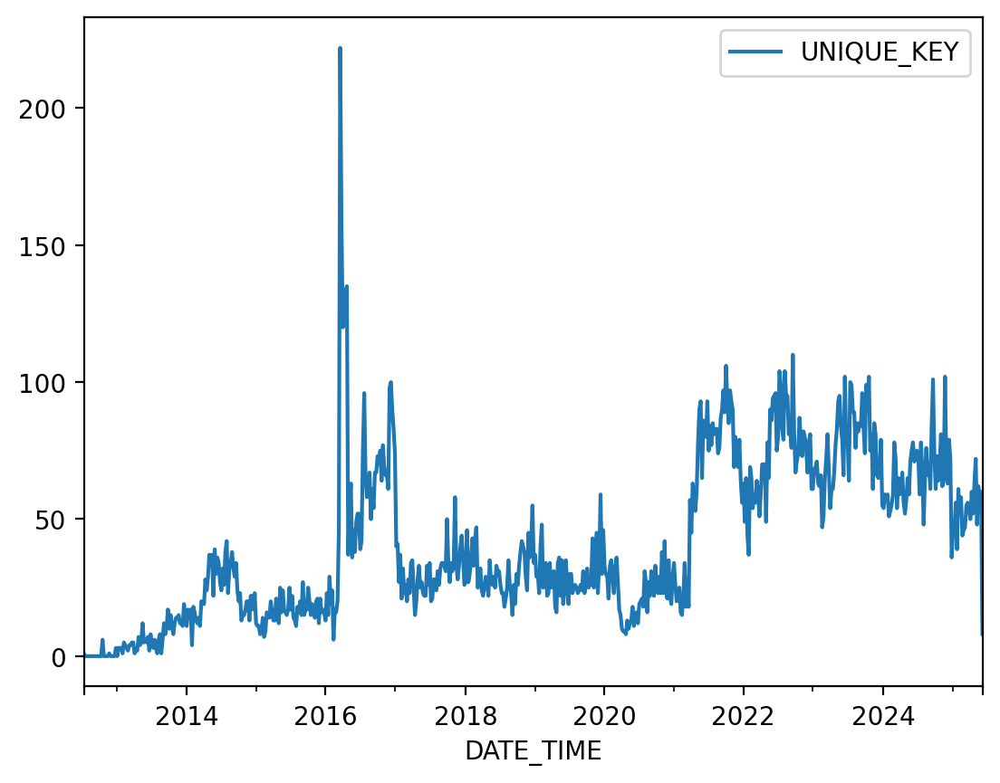

In [197]:
df[ df.UNIQUE_KEY.isin(todelete) ].pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

<Axes: xlabel='DATE_TIME'>

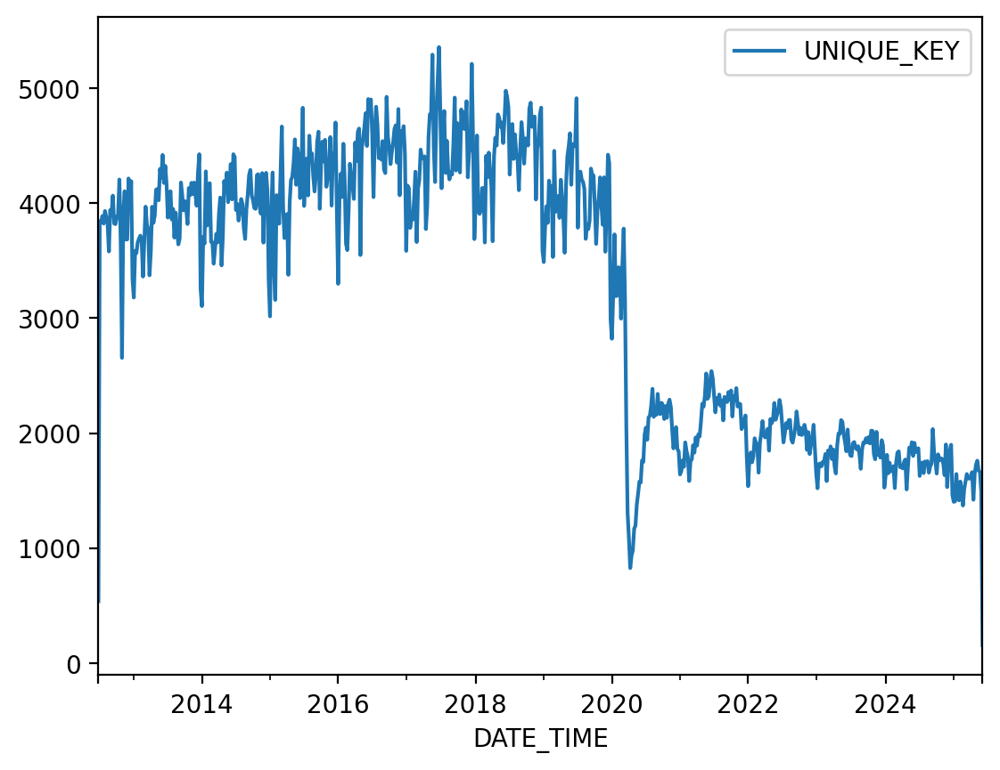

In [49]:
df.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

In [50]:
df = df[ ~df.UNIQUE_KEY.isin(todelete) ].copy()

## Lon/lat analysis, plus zipcode/borough

In [198]:
# The 'mask' sets rough bound box limits for NYC
mask = (df.LATITUDE > 40) & (df.LATITUDE < 41) & (df.LONGITUDE < -72) & (df.LONGITUDE > -74.5)


In [199]:
len(df[ ~mask ])

245741

In [200]:
len(df[ mask ])

1935482

<Axes: xlabel='DATE_TIME'>

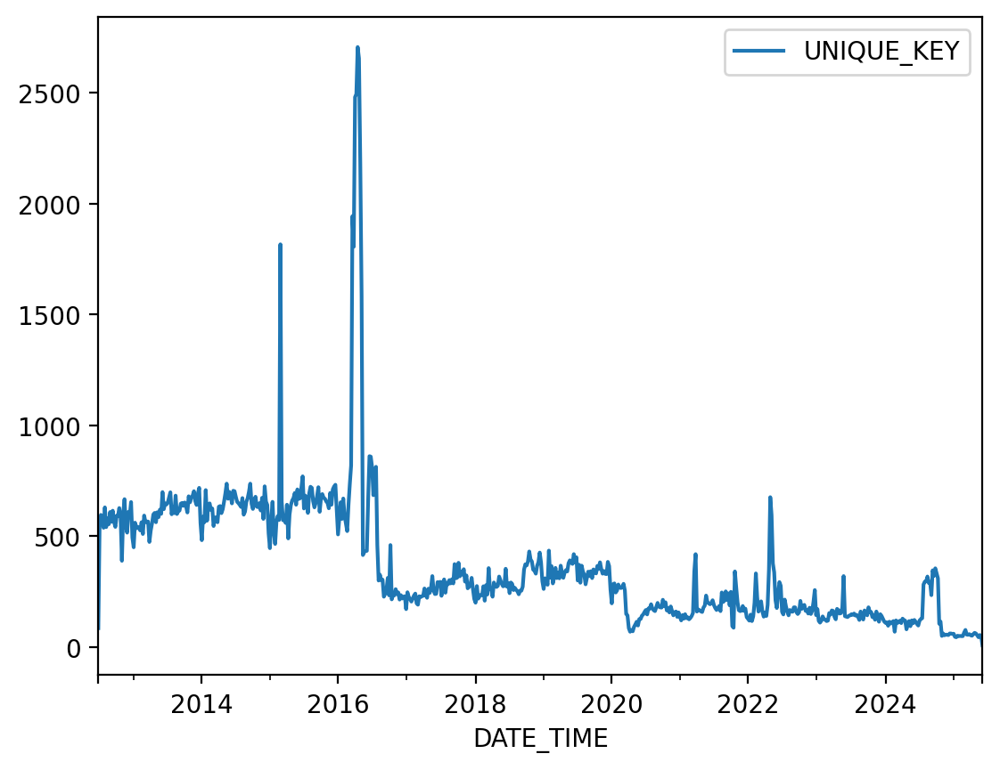

In [201]:
# Check if there is a temporal pattern in the errors
# where lon/lat are clearly not within NYC boundaries
# They are mostly missing ie. location = (0.0,0.0)
# The spikes are visible for the period of Mar-May 2016
# While we will drop these, it would be good to re-examine
# these later on
df[ ~mask ].pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

<Axes: xlabel='DATE_TIME'>

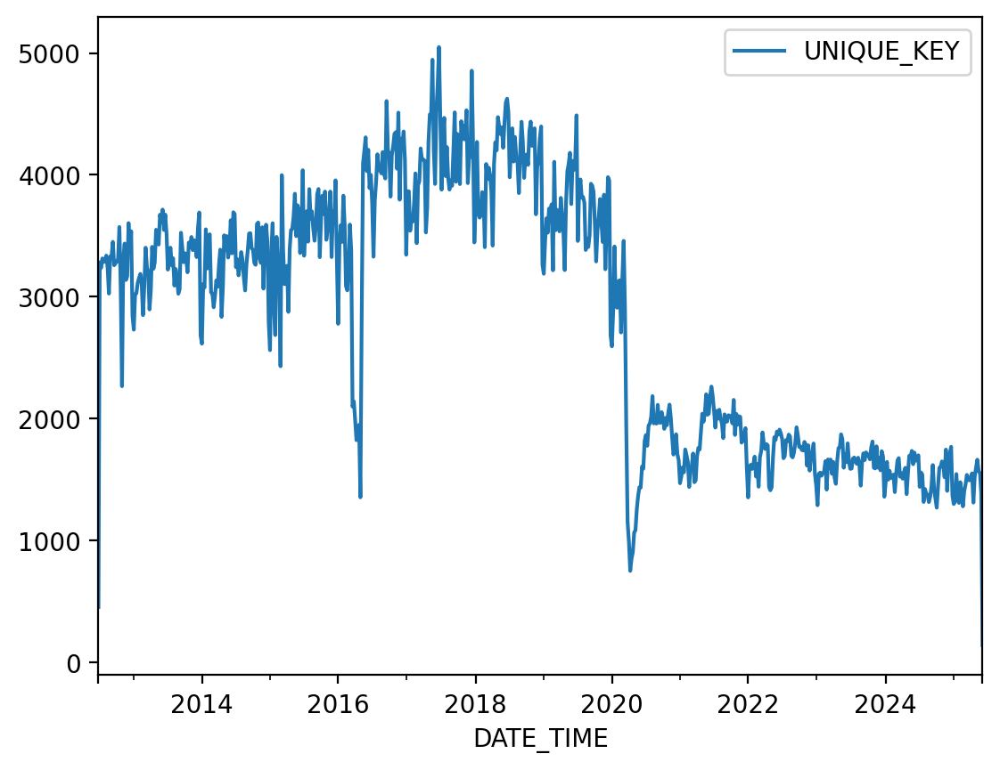

In [55]:
# We have a dillema here: If we drop the incorrect lon/lat values
# then we introduce clear abnormalities in the number of accidents over time
df[ mask ].pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

In [56]:
# FIXABLE error
# We have lon/lat within the NYC boundaries, but no borough
len(df[ mask & df.BOROUGH.isnull()])

463838

In [57]:
# FIXABLE error
# We have lon/lat within the NYC boundaries, but no ZIP
len(df[ mask & df.ZIPCODE.isnull()])

464077

In [58]:
# No cases where BOROUGH is null but zipcode is not
df[ df.BOROUGH.isnull() & ~df.ZIPCODE.isnull()]

,UNIQUE_KEY,DATE_TIME,BOROUGH,ZIPCODE,LATITUDE,LONGITUDE,LOCATION,ON_STREET_NAME,CROSS_STREET_NAME,OFF_STREET_NAME,PERSONS_INJURED,PERSONS_KILLED,PEDESTRIANS_INJURED,PEDESTRIANS_KILLED,CYCLISTS_INJURED,CYCLISTS_KILLED,MOTORISTS_INJURED,MOTORISTS_KILLED


In [202]:
# Small number of cases where the borough is missing but not zip
len(df[ ~df.BOROUGH.isnull() & df.ZIPCODE.isnull() ])

269

<Axes: xlabel='LONGITUDE', ylabel='LATITUDE'>

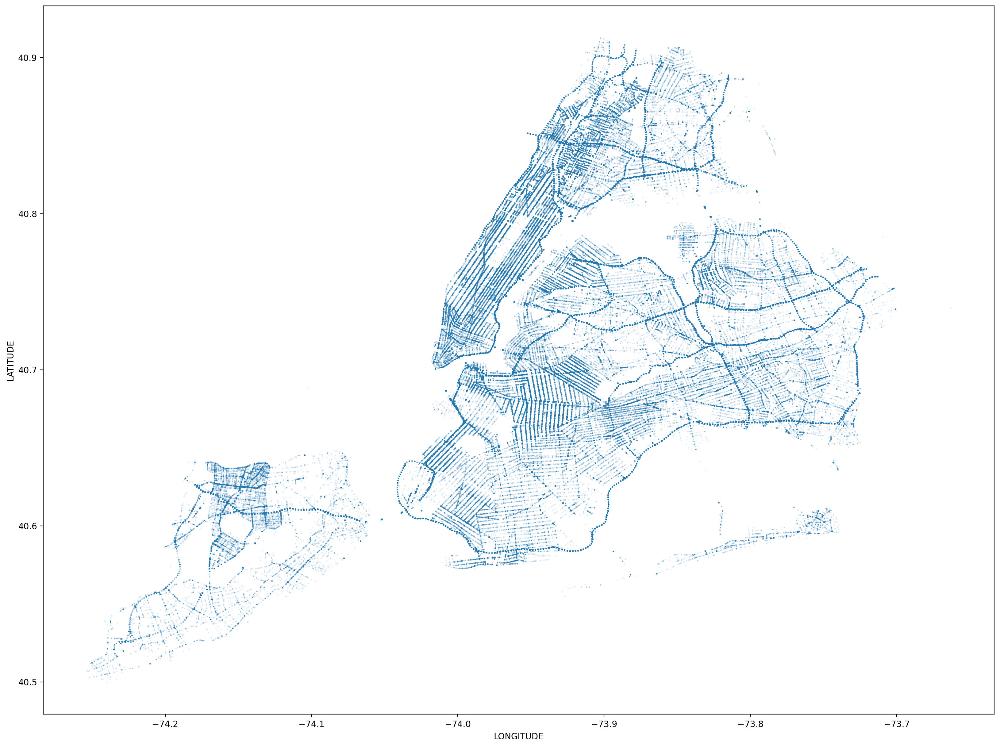

In [203]:
# A map of all the accidents where the BOROUGH is NULL
# We do not detect any obvious spatial patterns of missingness
# at least visually


df[ df.BOROUGH.isnull() & mask ].plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.1)

<Axes: xlabel='DATE_TIME'>

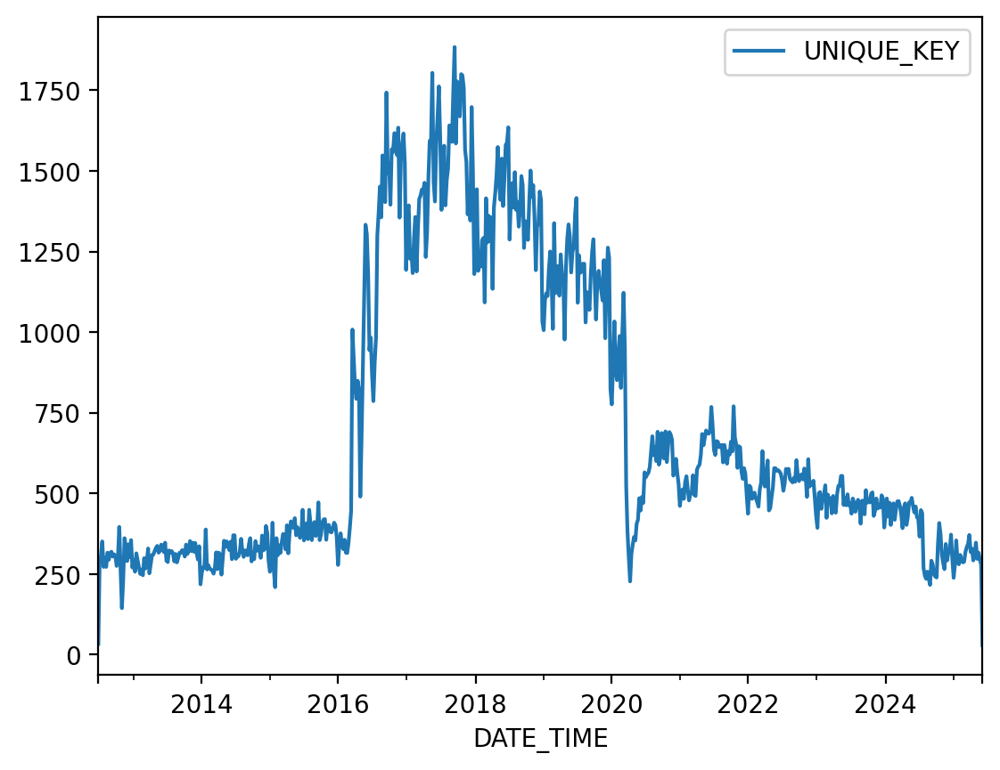

In [204]:
# Check if there is a temporal pattern in the errors

df[ df.BOROUGH.isnull() & mask ].pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

## Augment Borough and Zipcode using Shapefiles

In [205]:
%%time
# We start by converting the LON/LAT attributes into Shapely "geo-points"
# and convert the resut into a geodataframe so that we can do a spatial join
#from shapely.geometry import Point
#df['Coordinates'] = list(zip(df.LONGITUDE, df.LATITUDE))
#df['Coordinates'] = df['Coordinates'].apply(Point)
#gdf = gpd.GeoDataFrame(df, geometry='Coordinates')

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))

CPU times: user 2.58 s, sys: 512 ms, total: 3.1 s
Wall time: 3.08 s


In [206]:
len(df)

2181223

In [64]:
# We will now perform a spatial join with the NYC shapefile
# to find the neighborhood for each accident, and also filter out
# automatically all the accidents that have incorrect coordinates
# and/or incorrect BOROUGH listed

In [207]:
shapefile_url = 'https://data.cityofnewyork.us/resource/9nt8-h7nd.geojson'

df_nyc = gpd.GeoDataFrame.from_file(shapefile_url)
df_nyc = df_nyc.to_crs(4326)

In [66]:
# !mkdir -p maps
# !curl -s https://s-media.nyc.gov/agencies/dcp/assets/files/zip/data-tools/bytes/nynta2010_23a.zip  -o maps/nynta2010_23a.zip
# !cd maps && unzip -o nynta2010_23a.zip
# shapefile = f"maps/nynta2010_23a/nynta2010.shp"
# df_nyc = gpd.GeoDataFrame.from_file(shapefile)
# df_nyc = df_nyc.to_crs(4326)

In [208]:
%%time
# Match each accident with a neighborhood.
#
# This is done with left join,
# so we preserve all the data points
# but we know which ones are not matching with the shapefile
gdf.crs = df_nyc.crs
gdf = gpd.sjoin(gdf, df_nyc, how='left')


CPU times: user 13.7 s, sys: 1.94 s, total: 15.7 s
Wall time: 15.9 s


In [209]:
len(gdf)

2181223

In [210]:
gdf.columns, type(gdf)

(Index(['UNIQUE_KEY', 'DATE_TIME', 'BOROUGH', 'ZIPCODE', 'LATITUDE',
        'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME',
        'OFF_STREET_NAME', 'PERSONS_INJURED', 'PERSONS_KILLED',
        'PEDESTRIANS_INJURED', 'PEDESTRIANS_KILLED', 'CYCLISTS_INJURED',
        'CYCLISTS_KILLED', 'MOTORISTS_INJURED', 'MOTORISTS_KILLED', 'geometry',
        'index_right', 'shape_area', 'ntaname', 'cdtaname', 'shape_leng',
        'boroname', 'ntatype', 'nta2020', 'borocode', 'countyfips', 'ntaabbrev',
        'cdta2020'],
       dtype='object'),
 geopandas.geodataframe.GeoDataFrame)

,count
ZIPCODE,
5.0,1508304


In [213]:
# We keep only boro_name and ntaname
todrop = [
       'index_right', 'shape_area', 'cdtaname', 'shape_leng',
       'ntatype', 'nta2020', 'borocode', 'countyfips', 'ntaabbrev',
       'cdta2020'
]

gdf = gdf.drop(todrop, axis='columns')

# Rename the columns
gdf = gdf.rename({
    'boroname': 'GEO_BOROUGH',
    'ntaname': 'GEO_NEIGHBORHOOD',
},
                 axis='columns')

In [71]:
type(gdf)

geopandas.geodataframe.GeoDataFrame

In [214]:
shapefile_zip = 'https://data.cityofnewyork.us/resource/pri4-ifjk.geojson'

df_zip = gpd.GeoDataFrame.from_file(shapefile_zip)

df_zip

,modzcta,label,zcta,pop_est,geometry
0,10001,"10001, 10118","10001, 10119, 10199",23072,"MULTIPOLYGON (((-73.98774 40.74407, -73.98819 ..."
1,10002,10002,10002,74993,"MULTIPOLYGON (((-73.9975 40.71407, -73.99709 4..."
2,10003,10003,10003,54682,"MULTIPOLYGON (((-73.98864 40.72293, -73.98876 ..."
3,10026,10026,10026,39363,"MULTIPOLYGON (((-73.96201 40.80551, -73.96007 ..."
4,10004,10004,10004,3028,"MULTIPOLYGON (((-74.00827 40.70772, -74.00937 ..."
...,...,...,...,...,...
173,11434,11434,"11430, 11434",65989,"MULTIPOLYGON (((-73.75461 40.6472, -73.7538 40..."
174,11435,11435,11435,59296,"MULTIPOLYGON (((-73.80577 40.68293, -73.80606 ..."
175,11694,11694,11694,21354,"MULTIPOLYGON (((-73.86496 40.56663, -73.86558 ..."
176,11697,11697,11697,3540,"MULTIPOLYGON (((-73.86289 40.57606, -73.86281 ..."


In [215]:
%%time


# Converting the df_zip from {'init': 'epsg:2263'} coordinate system
# to the same lon/lat system used by df_nyc
df_zip = df_zip.to_crs(df_nyc.crs)

gdf.crs = df_zip.crs
gdf = gpd.sjoin(gdf, df_zip, how='left')

todrop = [
    'index_right','zcta', 'label' , 'pop_est'
]
gdf = gdf.drop(todrop, axis='columns')
gdf = gdf.rename({'ZIPCODE_left': 'ZIPCODE', 'modzcta': 'GEO_ZIPCODE'}, axis='columns')

CPU times: user 18.7 s, sys: 1.88 s, total: 20.6 s
Wall time: 20.7 s


In [216]:
gdf.columns.values

array(['UNIQUE_KEY', 'DATE_TIME', 'BOROUGH', 'ZIPCODE', 'LATITUDE',
       'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME',
       'OFF_STREET_NAME', 'PERSONS_INJURED', 'PERSONS_KILLED',
       'PEDESTRIANS_INJURED', 'PEDESTRIANS_KILLED', 'CYCLISTS_INJURED',
       'CYCLISTS_KILLED', 'MOTORISTS_INJURED', 'MOTORISTS_KILLED',
       'geometry', 'GEO_NEIGHBORHOOD', 'GEO_BOROUGH', 'GEO_ZIPCODE'],
      dtype=object)

In [217]:
len(gdf)

2181227

## Post-Augmentation Analysis of Inconsistencies

In [218]:
len(gdf)

2181227

In [219]:
# Ensure that all collisions are in place
not_matching = set(df['UNIQUE_KEY'].values) - set(gdf['UNIQUE_KEY'].values)
assert( len(not_matching) ==0 )

In [220]:
# Did not match with a shape within the NYC Neighborhoods
len(gdf[ gdf.GEO_BOROUGH.isnull() ])

254621

In [221]:
# Did not match with a shape within the NYC ZIP codes
len(gdf[ gdf.GEO_ZIPCODE.isnull() ])

254775

In [222]:
# Did not match with neither zip nor neighborhood
len(gdf[ gdf.GEO_ZIPCODE.isnull() & gdf.GEO_BOROUGH.isnull() ])

254528

In [223]:
len(gdf[ gdf.GEO_ZIPCODE.isnull() & ~gdf.GEO_BOROUGH.isnull() ])

247

In [224]:
len(gdf[ ~gdf.GEO_ZIPCODE.isnull() & gdf.GEO_BOROUGH.isnull() ])

93

### Outside general NYC area

These are mainly the entries with no lon/lat, or very incorrect lon/lat

In [225]:
# Defines  LON/LAT entries that are plausibly within NYC
mask = (gdf.LATITUDE > 40) & (gdf.LATITUDE < 41) & (gdf.LONGITUDE < -72) & (gdf.LONGITUDE > -74.5)


In [226]:
# These are the entries that we could filter out with a simple mask
nm1 = gdf[ gdf.GEO_BOROUGH.isnull() & ~mask ]
len(nm1)

245741

<Axes: xlabel='DATE_TIME'>

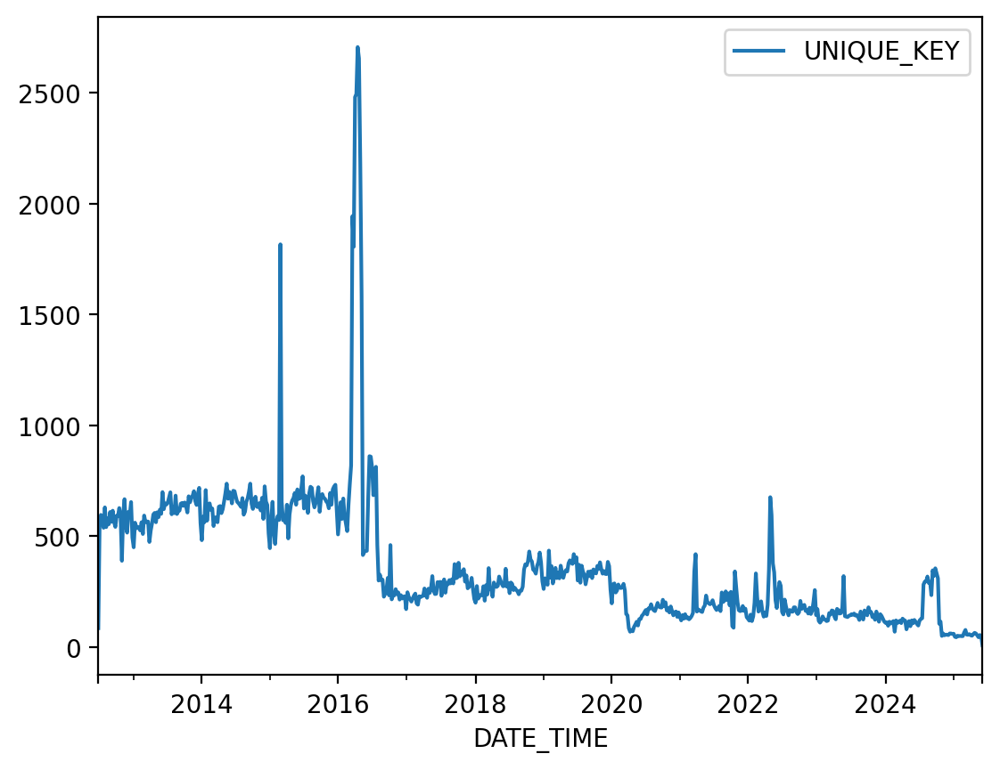

In [227]:
nm1.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

In [228]:
nm1.LOCATION.value_counts()

,count
LOCATION,
"(0.0, 0.0)",245592
"(40.75837, -201.23706)",105
"(40.665226, -32.768513)",16
"(40.5606, -74.742)",7
"(41.12615, -73.71353)",5
"(40.556175, -47.209625)",3
"(41.061634, -73.97066)",2
"(41.12421, -73.71412)",1
"(42.318317, -73.755936)",1


In [229]:
gdf = gdf[mask].copy()

In [230]:
len(gdf)

1935486

### No borough detected, within NYC boundaries

In [231]:
# These are the entries that are not matching with a neighborhood
# but are within the NYC boundaries.
nm2 = gdf[gdf.GEO_BOROUGH.isnull() ]
len(nm2)

8880

In [232]:
nm2.LOCATION.value_counts().head(10)

,count
LOCATION,
"(40.608757, -74.038086)",767
"(40.604153, -74.05198)",482
"(40.798256, -73.82744)",477
"(40.704422, -73.99491)",400
"(40.604313, -74.05208)",176
"(40.608364, -74.038666)",153
"(40.714527, -73.97481)",149
"(40.75834, -73.95775)",143
"(40.704388, -73.994576)",142


In [233]:
nm2['ON_STREET_NAME'].value_counts().head(10)

,count
ON_STREET_NAME,
VERRAZANO BRIDGE UPPER,859
BRONX WHITESTONE BRIDGE,774
BROOKLYN BRIDGE,606
VERRAZANO BRIDGE LOWER,355
THROGS NECK BRIDGE,344
WILLIAMSBURG BRIDGE OUTER ROADWA,341
BROOKLYN BATTERY TUNNEL,311
QUEENS MIDTOWN TUNNEL,310
CROSS BRONX EXPY,298


<Axes: xlabel='DATE_TIME'>

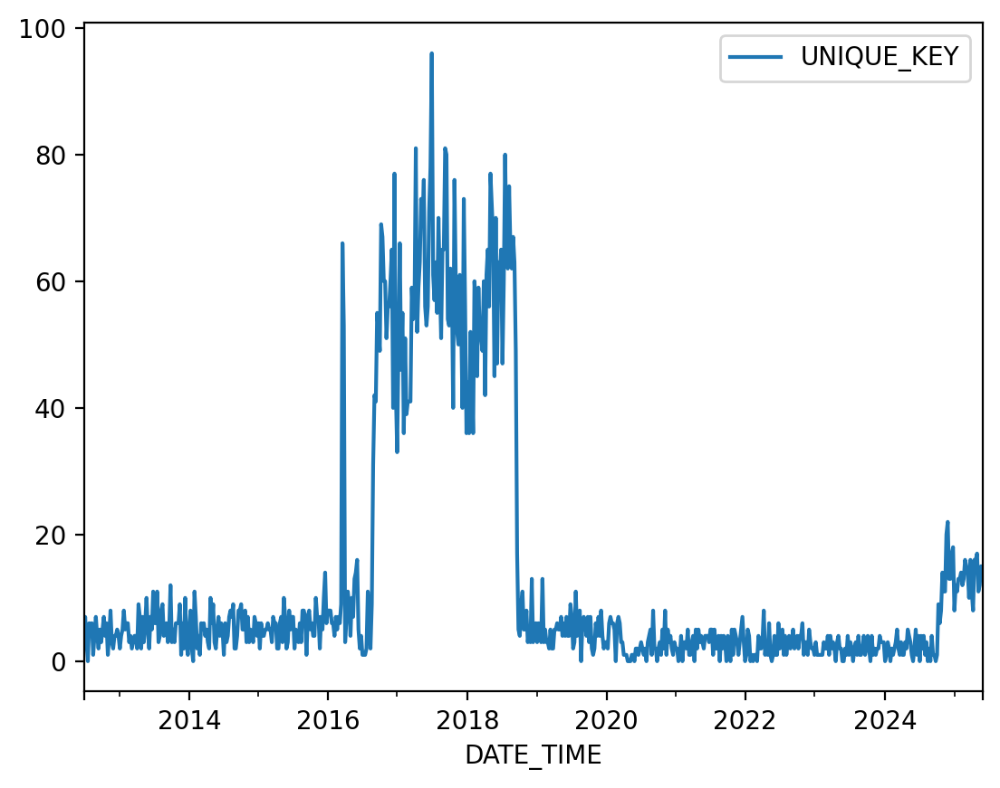

In [234]:
nm2.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

<Axes: >

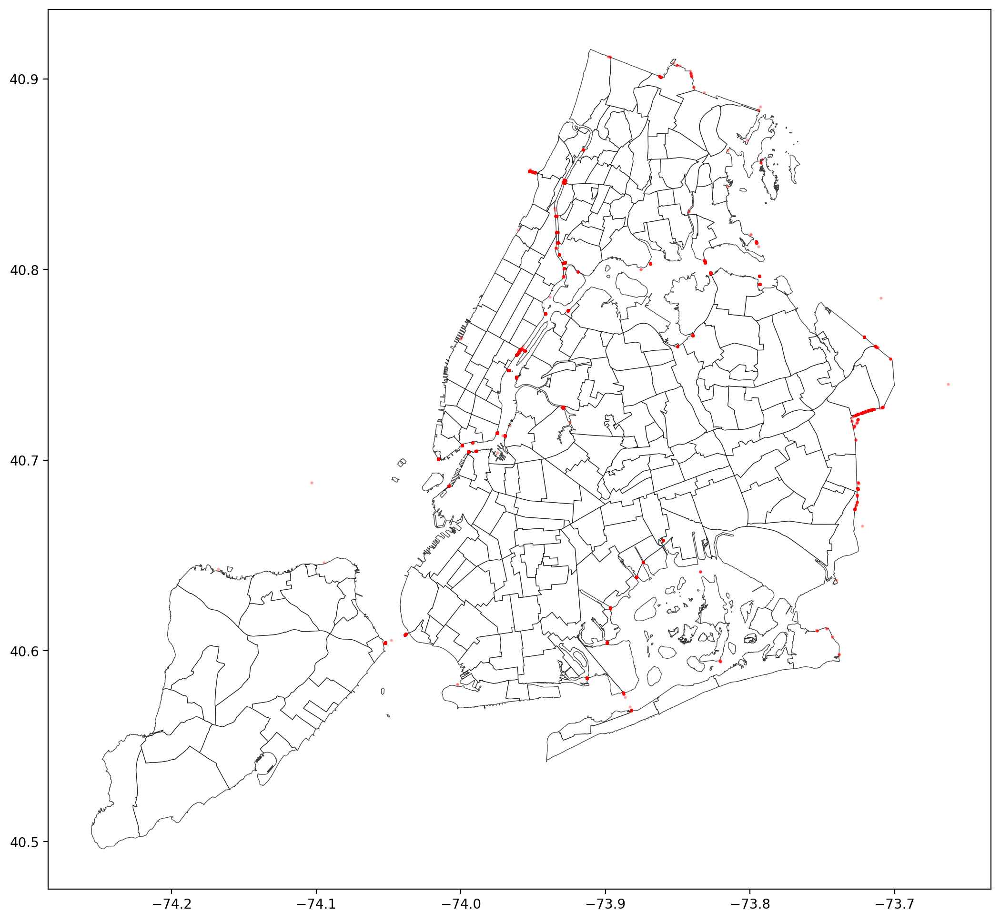

In [235]:
# The plot reveals that these are all bridge accidents
#
# Perhaps we may want to keep them in later versions
#
base = df_nyc.plot(linewidth=0.5,
                   color='White',
                   edgecolor='Black',
                   figsize=(15, 12),
                   alpha=0.75)

nm2.plot(figsize=(15, 12), c='red', markersize=2, alpha=0.25, ax=base)

<Axes: xlabel='DATE_TIME'>

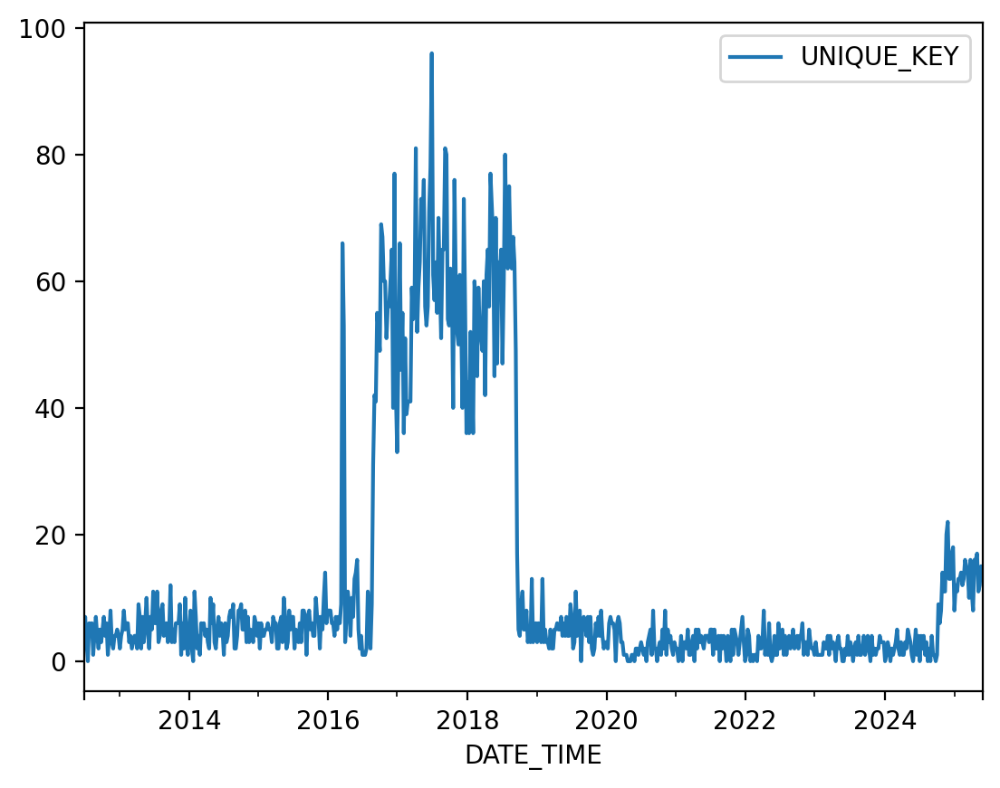

In [236]:
nm2.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

In [237]:
gdf = gdf[~gdf.GEO_BOROUGH.isnull() ].copy()

In [238]:
len(gdf)

1926606

### No ZIP detected, within NYC boundaries

In [239]:
# These are the entries that are not matching with a neighborhood
# but are within the NYC boundaries.
nm3 = gdf[gdf.GEO_ZIPCODE.isnull()   ]
len(nm3)

247

In [240]:
nm3['ON_STREET_NAME'].value_counts().head(20)

,count
ON_STREET_NAME,
JAMAICA AVENUE,75
CROSS ISLAND PARKWAY,41
CROSS ISLAND PARKWAY,38
LITTLE NECK PARKWAY,31
JAMAICA AVENUE,20
BRADDOCK AVENUE,11
JERICHO TURNPIKE,11
242 STREET,5
247 STREET,4


<Axes: >

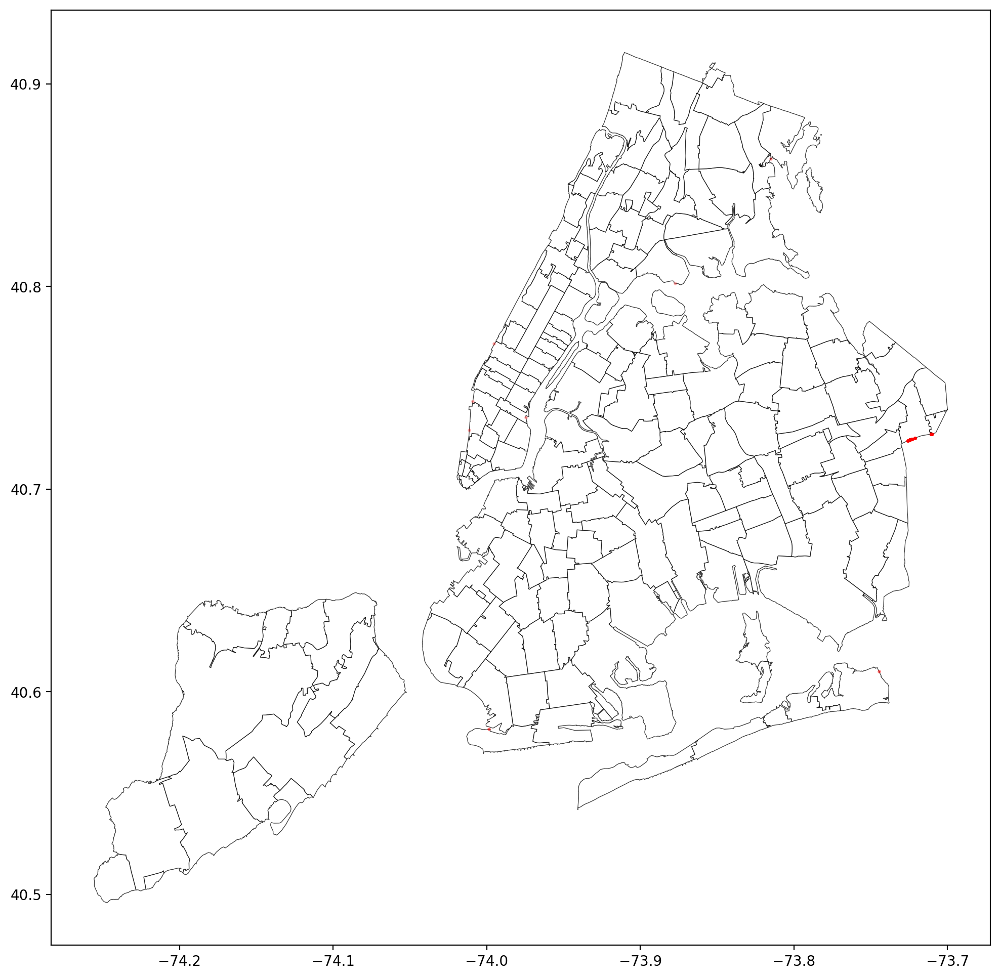

In [241]:
# The plot reveals that these are all bridge accidents
#
# Perhaps we may want to keep them in later versions
#
base = df_zip.plot(linewidth=0.5,
                   color='White',
                   edgecolor='Black',
                   figsize=(15, 12),
                   alpha=0.75)

nm3.plot(figsize=(15, 12), c='red', markersize=2, alpha=0.25, ax=base)

<ipython-input-242-10bc6a95b7bf>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('1M').sum().plot()


<Axes: xlabel='DATE_TIME'>

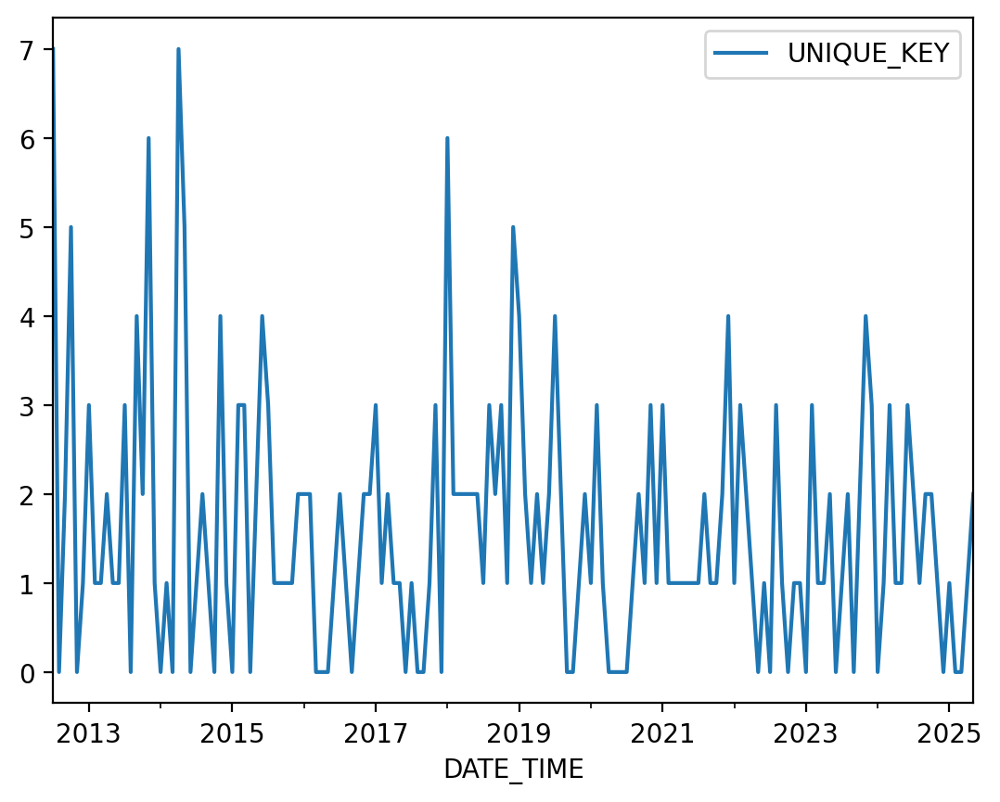

In [242]:
nm3.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1M').sum().plot()

In [243]:
gdf = gdf[ ~gdf.GEO_ZIPCODE.isnull()   ].copy()

In [244]:
len(gdf)

1926359

### Discrepancy between detected and reported borough

In [245]:
# Code below lists cases where the borough is incorrectly coded based on lon/lat
# TODO: Perhaps also check cases where zipcode is incorrectly coded
errors_boro = gdf[ ~gdf.BOROUGH.isnull() & ~gdf.GEO_BOROUGH.isnull() &
                  (gdf.GEO_BOROUGH.str.lower() != gdf.BOROUGH.str.lower())]
errors_boro = pd.DataFrame(errors_boro)

In [246]:
len(errors_boro)

1497

In [247]:
errors_boro.LOCATION.value_counts().head(10)

,count
LOCATION,
"(40.7136, -74.0091)",94
"(40.7244, -73.9818)",51
"(40.7339, -73.9542)",47
"(40.699531, -73.9110367)",28
"(40.68319, -73.8663)",20
"(40.6999378, -73.9118079)",19
"(40.69593, -73.90467)",18
"(40.7043114, -73.9132917)",18
"(40.674, -73.8721)",18


<Axes: xlabel='LONGITUDE', ylabel='LATITUDE'>

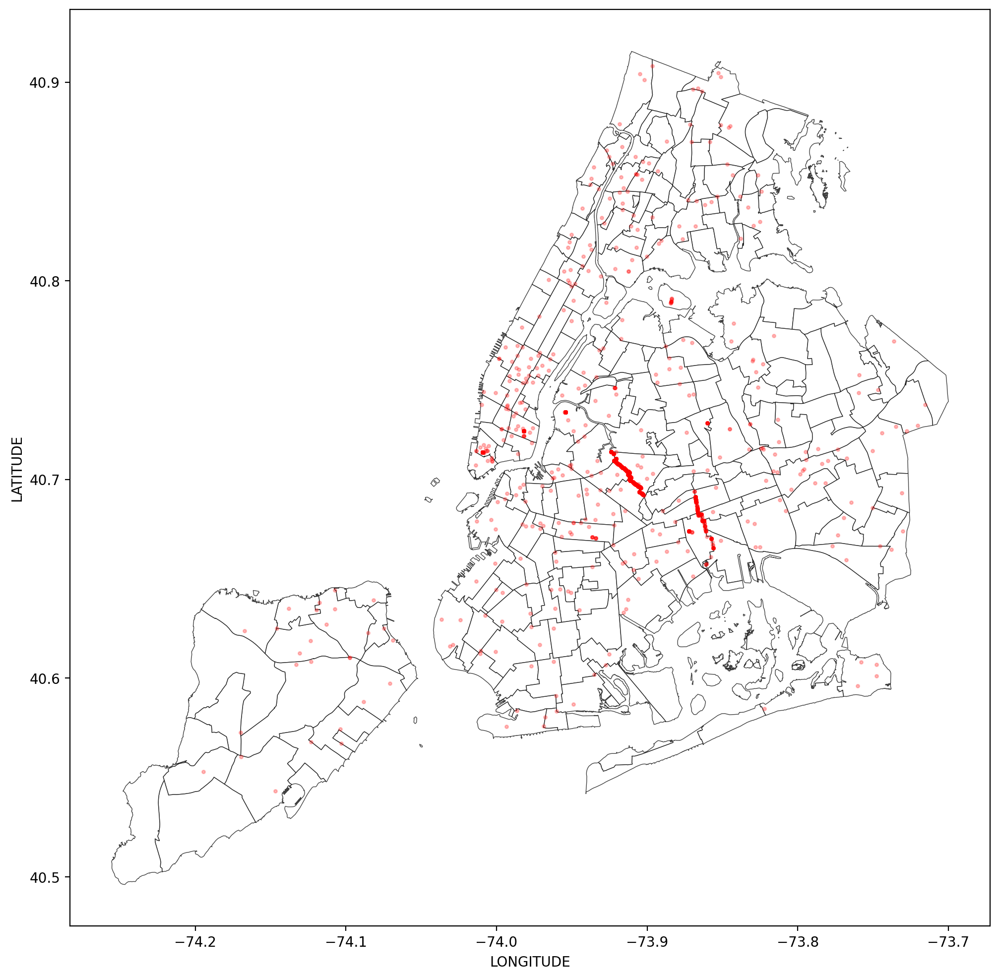

In [248]:
# The plot reveals that most are border issues
# but there are random errors spread throughout the city
base = df_nyc.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(15, 15),
    alpha=0.75)

errors_boro.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(15, 12),
    c='red',
    s=5,
    alpha=0.25, ax=base)

<ipython-input-250-b14c35c1339b>:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  ).resample('1M').sum().plot()


<Axes: xlabel='DATE_TIME'>

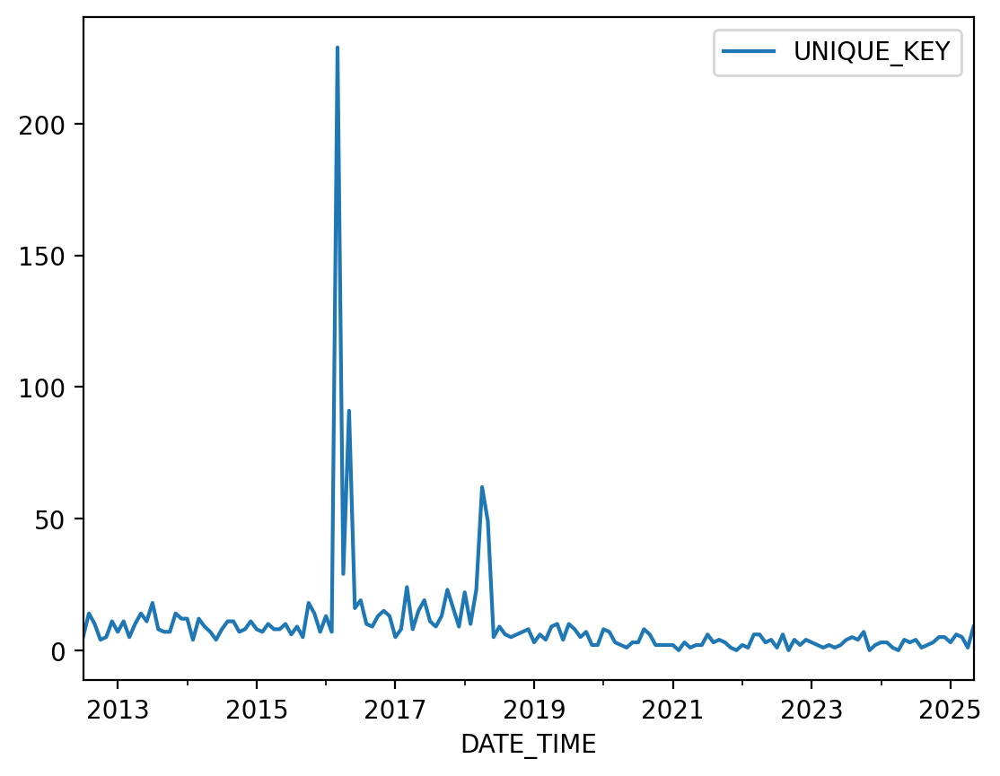

In [250]:
errors_boro.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1M').sum().plot()

### Discrepancy between detected and reported zip

In [251]:
# Code below lists cases where the zipcode is incorrectly coded based on lon/lat
errors_zip = gdf [ ~gdf.ZIPCODE.isnull() & ~gdf.GEO_ZIPCODE.isnull() & (gdf.GEO_ZIPCODE != gdf.ZIPCODE) ]
errors_zip = pd.DataFrame(errors_zip)
len(errors_zip)

128398

<Axes: xlabel='LONGITUDE', ylabel='LATITUDE'>

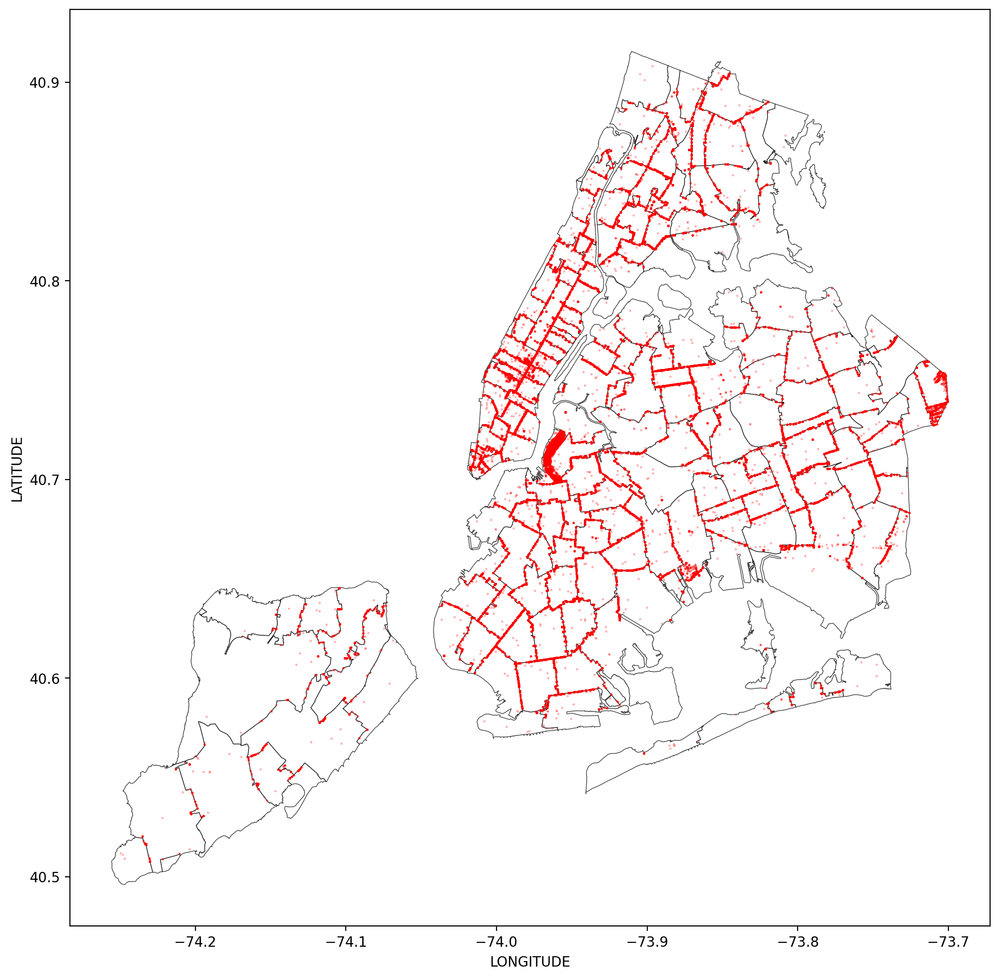

In [252]:
# The plot reveals that most are border issues
# but there are random errors spread throughout the city
base = df_zip.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(15, 15),
    alpha=0.75)

errors_zip.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(15, 12),
    c='red',
    s=0.5,
    alpha=0.25, ax=base)

<Axes: xlabel='DATE_TIME'>

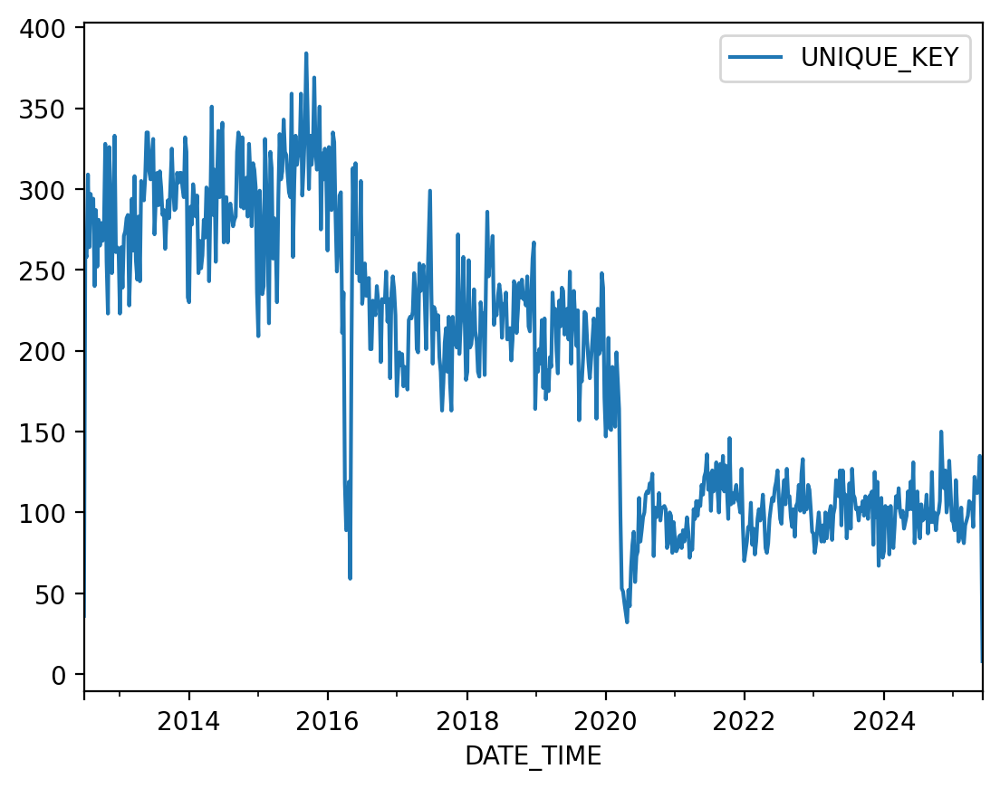

In [253]:
errors_zip.pivot_table(
    index='DATE_TIME',
    values='UNIQUE_KEY',
    aggfunc='count'
).resample('1W').sum().plot()

In [254]:
# Check cases where there was a reported ZIP code but not a detected one
errors_zip2 = gdf [  ~gdf.ZIPCODE.isnull() & gdf.GEO_ZIPCODE.isnull() ]
errors_zip2 = pd.DataFrame(errors_zip2)
len(errors_zip2)

0

## Prepare Final DataSet

In [255]:
gdf.columns.values

array(['UNIQUE_KEY', 'DATE_TIME', 'BOROUGH', 'ZIPCODE', 'LATITUDE',
       'LONGITUDE', 'LOCATION', 'ON_STREET_NAME', 'CROSS_STREET_NAME',
       'OFF_STREET_NAME', 'PERSONS_INJURED', 'PERSONS_KILLED',
       'PEDESTRIANS_INJURED', 'PEDESTRIANS_KILLED', 'CYCLISTS_INJURED',
       'CYCLISTS_KILLED', 'MOTORISTS_INJURED', 'MOTORISTS_KILLED',
       'geometry', 'GEO_NEIGHBORHOOD', 'GEO_BOROUGH', 'GEO_ZIPCODE'],
      dtype=object)

In [256]:
# Defines LON/LAT entries that are plausibly within NYC
# We will use the mask to set to NULL all other lat/lon values
# The analysis above indicates that the lon/lat that are within the mask
# but "do not match" are actually, fine and most are border cases
mask = (
    (gdf.LATITUDE > 40)
    & (gdf.LATITUDE < 41)
    & (gdf.LONGITUDE < -72)
    & (gdf.LONGITUDE > -74.5)
    & (~gdf.GEO_ZIPCODE.isnull())
    & (~gdf.GEO_BOROUGH.isnull())
)

gdf.loc[~mask, 'LATITUDE'] = None
gdf.loc[~mask, 'LONGITUDE'] = None

In [257]:
len(gdf[~mask])

0

In [258]:
# Keeping the ZIP and BOROUGH from the original dataset
# but changing its names, to distinguish from the detected
# ones from the shapefiles

gdf = gdf.rename(
    {
        'ZIPCODE': 'REPORTED_ZIPCODE',
        'BOROUGH': 'REPORTED_BOROUGH',
    },
    axis='columns')

gdf = gdf.rename(
    {
        'GEO_ZIPCODE': 'ZIPCODE',
        'GEO_BOROUGH': 'BOROUGH',
        'GEO_NEIGHBORHOOD': 'NEIGHBORHOOD'
    },
    axis='columns')

In [259]:
# Reorder the columns, dropping columns we do not need

columns = [
    'UNIQUE_KEY', 'DATE_TIME', 'LATITUDE', 'LONGITUDE',
    'ZIPCODE', 'NEIGHBORHOOD', 'BOROUGH',
    'PERSONS_INJURED', 'PERSONS_KILLED',
    'PEDESTRIANS_INJURED', 'PEDESTRIANS_KILLED',
    'CYCLISTS_INJURED', 'CYCLISTS_KILLED',
    'MOTORISTS_INJURED', 'MOTORISTS_KILLED',
    'ON_STREET_NAME', 'CROSS_STREET_NAME', 'OFF_STREET_NAME',
    'REPORTED_ZIPCODE', 'REPORTED_BOROUGH'
]

gdf = gdf[columns]

In [260]:
# Sort by date
gdf = gdf.sort_values('DATE_TIME')

In [261]:
final_df = pd.DataFrame(gdf)

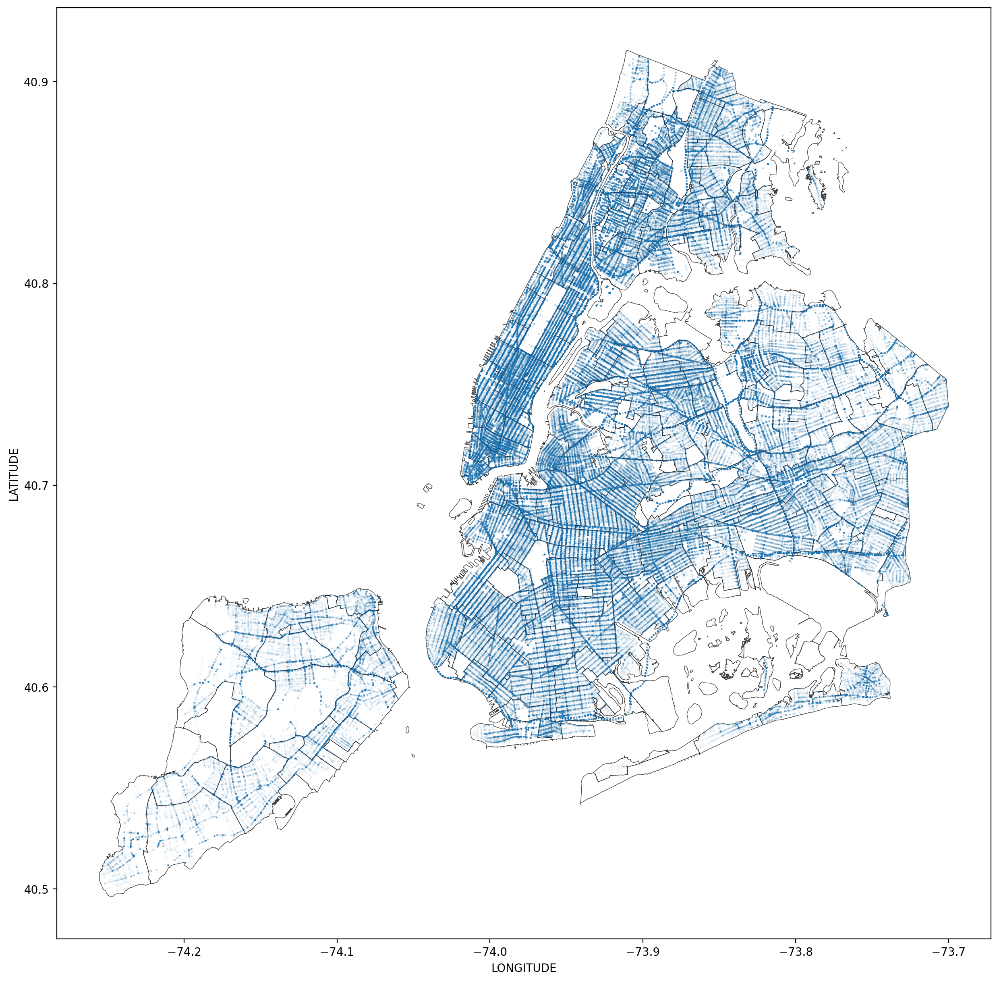

In [142]:
base = df_nyc.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(15, 15),
    alpha=0.75)

scatterplot = final_df.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    s=0.5,
    alpha=0.02,
    ax=base)

In [119]:
# final_df.to_csv('collisions.csv.gz', index=False, compression='gzip')

In [262]:
# 4050018: Panos :-)
final_df.query('UNIQUE_KEY  == "4050018"').T

,696176
UNIQUE_KEY,4050018
DATE_TIME,2018-12-21 20:10:00
LATITUDE,40.742832
LONGITUDE,-74.00771
ZIPCODE,10011
NEIGHBORHOOD,Chelsea-Hudson Yards
BOROUGH,Manhattan
PERSONS_INJURED,0
PERSONS_KILLED,0
PEDESTRIANS_INJURED,0


## Contributing factor and Vehicle type

* Examine the contents of Contributing factor and Vehicle type. Replace noisy values with UNSPECIFIED

* Add a column "NUM_VEHICLES" to show the number of vehicles involved in the accident. Check that we do not have NaNs before a real value in CAUSE and in VEHICLE TYPE, and that the two columns (CAUSE AND VEHICLE) agree in the number.

In [263]:
ct_df

,CAUSE,VEHICLE_TYPE,VEHICLE
UNIQUE_KEY,,,
0000022,UNSPECIFIED,SPORT UTILITY / STATION WAGON,1
0000022,UNSPECIFIED,VAN,2
0000023,UNSPECIFIED,TAXI,1
0000023,UNSPECIFIED,TAXI,2
0000024,OVERSIZED VEHICLE,BUS,1
...,...,...,...
4818023,UNSPECIFIED,SEDAN,2
4818024,FOLLOWING TOO CLOSELY,STATION WAGON/SPORT UTILITY VEHICLE,1
4818024,UNSPECIFIED,SEDAN,2


In [264]:
len(set(ct_df.index) - set(final_df.UNIQUE_KEY.values))

253122

In [265]:
ct_df.CAUSE.value_counts()

,count
CAUSE,
UNSPECIFIED,2348695
DRIVER INATTENTION/DISTRACTION,537081
FAILURE TO YIELD RIGHT-OF-WAY,146267
FOLLOWING TOO CLOSELY,139118
OTHER VEHICULAR,104214
BACKING UNSAFELY,87270
PASSING OR LANE USAGE IMPROPER,75178
PASSING TOO CLOSELY,63628
TURNING IMPROPERLY,62453


In [266]:
# We replace noisy causes with UNSPECIFIED and not with NaN, as NaN is used to mean "no vehicle"
import numpy as np
ct_df.CAUSE = ct_df.CAUSE.replace(to_replace='1', value='UNSPECIFIED')
ct_df.CAUSE = ct_df.CAUSE.replace(to_replace='80', value='UNSPECIFIED')
ct_df.CAUSE = ct_df.CAUSE.replace(to_replace='ILLNES', value='ILLNESS')

In [267]:
ct_df.VEHICLE_TYPE.value_counts()

,count
VEHICLE_TYPE,
SEDAN,1114402
STATION WAGON/SPORT UTILITY VEHICLE,886156
PASSENGER VEHICLE,762459
SPORT UTILITY / STATION WAGON,333564
TAXI,155899
...,...
CRWZK,1
�MBU,1
U-TRU,1


In [268]:
# Also consult https://data.ny.gov/api/assets/83055271-29A6-4ED4-9374-E159F30DB5AE

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='STATION WAGON/SPORT UTILITY VEHICLE', value='SPORT UTILITY / STATION WAGON')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SUBN', value='SPORT UTILITY / STATION WAGON')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SUBN/', value='SPORT UTILITY / STATION WAGON')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='WAGON', value='SPORT UTILITY / STATION WAGON')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BU', value='BUS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BS', value='BUS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SCHOOL BUS', value='BUS')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='P/SH', value='POWER SHOVEL')



ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MULTI-WHEELED VEHICLE', value='LARGE COM VEH(6 OR MORE TIRES)')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SMALL', value='SMALL COM VEH(4 TIRES)')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SMALL COM VEH(4 TIRES) ', value='SMALL COM VEH(4 TIRES)')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='LIVER', value='LIVERY VEHICLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='LIMOU', value='LIVERY VEHICLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='LIMO', value='LIVERY VEHICLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='LIMO/', value='LIVERY VEHICLE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FORKL', value='FORK LIFT')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FORK', value='FORK LIFT')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DUMP', value='DUMP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DUMPS', value='DUMP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DUMPT', value='DUMP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PUMP', value='DUMP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DP', value='DUMP TRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='GARBA', value='GARBAGE OR REFUSE')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='CONV', value='CONVERTIBLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='CONVE', value='CONVERTIBLE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SP', value='SNOW PLOW')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='2 DR SEDAN', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='4 DR SEDAN', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SUDAN', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SE', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='4DS', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='4DSD', value='SEDAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='3-DOOR', value='SEDAN')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN CAMPER', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN T', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN F', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN A', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN W', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN/B', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAB', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VANG', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN C', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN/T', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VANETTE', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN`', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAV', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VN', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='VAN (', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ENCLOSED BODY - REMOVABLE ENCLOSURE', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ENCLOSED BODY - NONREMOVABLE ENCLOSURE', value='VAN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ENCLO', value='VAN')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOTOR HOME', value='R/V')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOTORIZED HOME', value='R/V')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='RV', value='R/V')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='R/V C', value='R/V')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='RV/TR', value='R/V')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='H/WH', value='R/V') # house on wheels


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AM', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMB', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMBU', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMBUL', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ANBUL', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMABU', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMULA', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ABULA', value='AMBULANCE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BICYC', value='BICYCLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BIKE', value='BICYCLE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TANK', value='TANK TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TANKE', value='TANK TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TANKER', value='TANK TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='OTHER', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNK', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNK,', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNKN', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNKNO', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNKNOWN', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNKOW', value='UNKNOWN')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='UNNKO', value='UNKNOWN')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SC', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SCOO', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SCOOT', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOTER', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOPD', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOPAD', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOPET', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOPEN', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='E BIK', value='E-BIKE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='E-BIK', value='E-BIKE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='E/BIK', value='E-BIKE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MINIBIKE', value='SCOOTER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOPED', value='SCOOTER')



ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='US PO', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='USPOS', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='USPS2', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='USPST', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='U.S P', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='U.S.', value='USPS')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='USPS TRUCK', value='USPS')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMME', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COM', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMM', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COM T', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COM.', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMMM', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMER', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMMM', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COM.', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMIX', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMPA', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMB', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMMU', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='COMM.', value='COMMERCIAL')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='C0MME', value='COMMERCIAL')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PASS', value='PASSENGER VEHICLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PAS', value='PASSENGER VEHICLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PASSE', value='PASSENGER VEHICLE')



ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PEDIC', value='PEDICAB')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOW T', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOW', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOW TRUCK', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOWTR', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOW-T', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOWIN', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TOWER', value='TOW TRUCK / WRECKER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='G TOW', value='TOW TRUCK / WRECKER')



ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TKP', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PK', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PICK', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PICK-', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PICKU', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PICKUP WITH MOUNTED CAMPER', value='PICK-UP TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLAT BED', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLAT RACK', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLATB', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLAT', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLAT RACK', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FLATB', value='PICK-UP TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BACK', value='PICK-UP TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FDNY', value='FIRE TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FIRE', value='FIRE TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FIRET', value='FIRE TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FD NY', value='FIRE TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FD TR', value='FIRE TRUCK')




ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACTOR TRUCK DIESEL', value='TRACTOR TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACTOR TRUCK GASOLINE', value='TRACTOR TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRAC.', value='TRACTOR TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRAC', value='TRACTOR TRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRAIL', value='TRAILER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TR', value='TRAILER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRL', value='TRAILER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRAIL', value='TRAILER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRLR', value='TRAILER')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SEMI', value='TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SEMI-', value='TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MACK', value='TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TK', value='TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACT', value='TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRK', value='TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACK', value='TRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FB', value='BOX TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BOX T', value='BOX TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BOX', value='BOX TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='BOXTR', value='BOX TRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOTOR', value='MOTORCYCLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MINICYCLE', value='MOTORCYCLE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='MOTORBIKE', value='MOTORCYCLE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DSNY', value='SANITATION')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DS', value='SANITATION')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='SANIT', value='SANITATION')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DELV', value='DELIVERY TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='DEL', value='DELIVERY TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='RD/S', value='ROAD SWEEPER')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='OML/', value='LIVERY VEHICLE') # OMNIBUS LIVERY

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FIRE TRUCK', value='FIRETRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACTOR TR', value='TRACTOR TRUCK')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='TRACTOR', value='TRACTOR TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='EBIKE', value='E-BIKE')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='FDNY TRUCK', value='FIRETRUCK')


ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='PICK UP TR', value='PICK-UP TRUCK')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='GARBAGE TR', value='E-SCOOTER')

ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMBULANCE`', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='ALMBULANCE', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMUBULANCE', value='AMBULANCE')
ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace='AMULANCE', value='AMBULANCE')





In [269]:
'''
import ngram
import math
freq = ct_df.VEHICLE_TYPE.value_counts()
vtypes = set(ct_df.VEHICLE_TYPE.values)

similarities = []
for t1 in vtypes:
    for t2 in vtypes:
        s = ngram.NGram.compare(t1, t2, n=2)
        f1 = freq.loc[t1]
        f2 = freq.loc[t2]
        r = abs(math.log10(f1/f2))
        f = f1 + f2
        if f2 > f1:
            fr1 = f2
            fr2 = f1
            tp1 = t2
            tp2 = t1
        else:
            fr1 = f1
            fr2 = f2
            tp1 = t1
            tp2 = t2

        sim = {
            "t1" : tp1,
            "f1" : fr1,
            "t2" : tp2,
            "f2" : fr2,
            "sim" : s,
            "ratio" : r
        }

        if t1>t2 and s>0.1 and f > 1000 and r>1.5: # and min(f1,f2)<200:
            similarities.append(sim)

pd.DataFrame(similarities).sort_values('sim', ascending=False).head(50)
'''

'\nimport ngram\nimport math\nfreq = ct_df.VEHICLE_TYPE.value_counts()\nvtypes = set(ct_df.VEHICLE_TYPE.values)\n\nsimilarities = []\nfor t1 in vtypes:\n    for t2 in vtypes:\n        s = ngram.NGram.compare(t1, t2, n=2)\n        f1 = freq.loc[t1]\n        f2 = freq.loc[t2]\n        r = abs(math.log10(f1/f2))\n        f = f1 + f2\n        if f2 > f1:\n            fr1 = f2\n            fr2 = f1\n            tp1 = t2\n            tp2 = t1\n        else:\n            fr1 = f1\n            fr2 = f2\n            tp1 = t1\n            tp2 = t2\n\n        sim = {\n            "t1" : tp1,\n            "f1" : fr1,\n            "t2" : tp2,\n            "f2" : fr2,\n            "sim" : s,\n            "ratio" : r\n        }\n\n        if t1>t2 and s>0.1 and f > 1000 and r>1.5: # and min(f1,f2)<200:\n            similarities.append(sim)\n\npd.DataFrame(similarities).sort_values(\'sim\', ascending=False).head(50)\n'

In [270]:
# Replace all low-frequency vehicle types with UNKNOWN

# freq = ct_df.VEHICLE_TYPE.value_counts()

# replace = freq [ freq <= 10]
# for r in replace.index.values:
#    ct_df.VEHICLE_TYPE = ct_df.VEHICLE_TYPE.replace(to_replace=r, value='UNKNOWN')


In [271]:
# ct_df.to_csv('collisions-causes.csv.gz', index=False, compression='gzip')

In [272]:
t_end = datetime.now()

t_end

datetime.datetime(2025, 6, 6, 20, 23, 50, 177850)

In [273]:
t_end - t_start

datetime.timedelta(seconds=2028, microseconds=629056)

# MySQL

In [132]:
!sudo pip3 install -U -q PyMySQL sqlalchemy sql_magic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 103.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.2 MB/s eta 0:00:00


In [274]:
import os
from sqlalchemy import create_engine
from sqlalchemy import text

conn_string = 'mysql+pymysql://{user}:{password}@{host}/?charset=utf8mb4'.format(
    host = 'db.ipeirotis.org',
    user = 'root',
    password = mysql_pass,
    encoding = 'utf8mb4')

engine = create_engine(conn_string)
con = engine.connect()

In [275]:
con.close()

In [286]:
# Query to create a database
db_name = 'collisions'

sql = f"DROP DATABASE IF EXISTS {db_name}"
with engine.connect() as connection:
  connection.execute(text(sql))

# Create a database
sql = f"CREATE DATABASE IF NOT EXISTS {db_name} DEFAULT CHARACTER SET 'utf8mb4'"
with engine.connect() as connection:
  connection.execute(text(sql))


# And lets switch to the database
sql = f"USE {db_name}"
with engine.connect() as connection:
  connection.execute(text(sql))


In [287]:
duplicate_keys = final_df.UNIQUE_KEY.value_counts()[(final_df.UNIQUE_KEY.value_counts() > 1)].index.values
final_df = final_df[~final_df.UNIQUE_KEY.isin(duplicate_keys)]

In [288]:
neigh_enum = "ENUM(" + " , ".join([f'"{n}"' for n in final_df.NEIGHBORHOOD.unique()]) + ")"

In [289]:
drop_table = "DROP TABLE IF EXISTS collisions;"
with engine.connect() as connection:
  connection.execute(text(drop_table))


create_table_sql = f'''
CREATE TABLE collisions(
    UNIQUE_KEY char(7),
    DATE_TIME               datetime,
    LATITUDE                      double,
    LONGITUDE                     double,
    ZIPCODE                        char(5),
    NEIGHBORHOOD                   {neigh_enum},
    BOROUGH                        enum('Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island'),
    PERSONS_INJURED                 tinyint,
    PERSONS_KILLED                  tinyint,
    PEDESTRIANS_INJURED             tinyint,
    PEDESTRIANS_KILLED              tinyint,
    CYCLISTS_INJURED                tinyint,
    CYCLISTS_KILLED                 tinyint,
    MOTORISTS_INJURED               tinyint,
    MOTORISTS_KILLED                tinyint,
    ON_STREET_NAME                 varchar(50),
    CROSS_STREET_NAME              varchar(50),
    OFF_STREET_NAME                varchar(50),
    REPORTED_ZIPCODE             char(5),
    REPORTED_BOROUGH             enum('BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND'),
  PRIMARY KEY (UNIQUE_KEY)
) ENGINE=InnoDB DEFAULT CHARSET=utf8mb4;
'''
with engine.connect() as connection:
  connection.execute(text(create_table_sql))

In [139]:
# final_df = final_df.drop(columns=['ZIPCODE', 'BOROUGH'], axis='columns')

In [290]:
final_df.ZIPCODE.str.len().value_counts()

,count
ZIPCODE,
5,1926351


In [291]:
# Create a table
# See http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.to_sql.html for the documentation
from tqdm import tqdm
batchsize = 10000
batches = len(final_df) // batchsize + 1

t = tqdm(range(batches))

for i in t:
    # print("Batch:",i)
    # continue
    start = batchsize * i
    end = batchsize * (i+1)
    final_df[start:end].to_sql(
        name = 'collisions',
        schema = db_name,
        con = engine,
        if_exists = 'append',
        index = False,
        chunksize = 1000)

100%|██████████| 193/193 [09:40<00:00,  3.01s/it]


In [292]:
create_table_sql = '''
CREATE TABLE vehicles_involved(
    UNIQUE_KEY char(7),
    VEHICLE               tinyint,
    CAUSE                      varchar(60),
    VEHICLE_TYPE                     varchar(60),
  PRIMARY KEY (UNIQUE_KEY, VEHICLE),
  FOREIGN KEY(UNIQUE_KEY) REFERENCES collisions(UNIQUE_KEY)
) ENGINE=InnoDB DEFAULT CHARSET=utf8mb4;
'''
with engine.connect() as connection:
  connection.execute(text(create_table_sql))




In [293]:
vehicle_causes = ct_df.reset_index()

In [294]:
vehicle_causes = vehicle_causes[ vehicle_causes.UNIQUE_KEY.isin(final_df.UNIQUE_KEY.values)]

In [295]:
vehicle_causes

,UNIQUE_KEY,CAUSE,VEHICLE_TYPE,VEHICLE
0,0000022,UNSPECIFIED,SPORT UTILITY / STATION WAGON,1
1,0000022,UNSPECIFIED,VAN,2
2,0000023,UNSPECIFIED,TAXI,1
3,0000023,UNSPECIFIED,TAXI,2
6,0000025,DRIVER INATTENTION/DISTRACTION,PASSENGER VEHICLE,1
...,...,...,...,...
4077457,4818023,UNSPECIFIED,SEDAN,2
4077458,4818024,FOLLOWING TOO CLOSELY,SPORT UTILITY / STATION WAGON,1
4077459,4818024,UNSPECIFIED,SEDAN,2
4077460,4818026,TURNING IMPROPERLY,SPORT UTILITY / STATION WAGON,1


In [296]:
# Create a table
# See http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.to_sql.html for the documentation
from tqdm import tqdm
batchsize = 50000
batches = len(vehicle_causes) // batchsize + 1

t = tqdm(range(batches))

for i in t:
    # print("Batch:",i)
    # continue
    start = batchsize * i
    end = batchsize * (i+1)
    vehicle_causes[start:end].to_sql(
        name = 'vehicles_involved',
        schema = db_name,
        con = engine,
        if_exists = 'append',
        index = False,
        chunksize = 1000)

100%|██████████| 72/72 [12:40<00:00, 10.56s/it]


In [297]:
sql = f'''
GRANT SELECT ON {db_name}.* TO 'student'@'%'
'''
with engine.connect() as connection:
  connection.execute(text(sql))

In [298]:
sql = "CREATE INDEX ix_cause ON collisions.vehicles_involved(CAUSE)"

with engine.connect() as connection:
  connection.execute(text(sql))

In [299]:
sql = "CREATE INDEX ix_date ON collisions.collisions(DATE_TIME)"
with engine.connect() as connection:
  connection.execute(text(sql))

In [300]:
sql = "CREATE INDEX ix_boro ON collisions.collisions(REPORTED_BOROUGH)"
with engine.connect() as connection:
  connection.execute(text(sql))

In [301]:
sql = "CREATE INDEX ix_hood ON collisions.collisions(NEIGHBORHOOD)"
with engine.connect() as connection:
  connection.execute(text(sql))

# BigQuery

Prompt:

> I also want to store the tables in BigQuery, in the nyu-datasets project, under the dataset collisions.
> I want to add descriptions for the columns when we create the schema, and then generate the SQL commands that allow for having table descriptions and ot define primary keys and foreign keys (even if they are not enforced)


In [302]:
from google.colab import auth
auth.authenticate_user()

!pip install -q google-cloud-bigquery

In [303]:
from google.cloud.bigquery import SchemaField

collisions_schema = [
    SchemaField("UNIQUE_KEY", "STRING", mode="REQUIRED", description="Unique identifier for the collision"),
    SchemaField("DATE_TIME", "TIMESTAMP", mode="REQUIRED", description="Date and time of the collision"),
    SchemaField("LATITUDE", "FLOAT", description="Latitude of the collision location"),
    SchemaField("LONGITUDE", "FLOAT", description="Longitude of the collision location"),
    SchemaField("ZIPCODE", "STRING", description="Detected ZIP code of the collision location"),
    SchemaField("NEIGHBORHOOD", "STRING", description="Detected neighborhood of the collision location"),
    SchemaField("BOROUGH", "STRING", description="Detected borough of the collision location"),
    SchemaField("PERSONS_INJURED", "INTEGER", description="Total number of persons injured"),
    SchemaField("PERSONS_KILLED", "INTEGER", description="Total number of persons killed"),
    SchemaField("PEDESTRIANS_INJURED", "INTEGER", description="Number of pedestrians injured"),
    SchemaField("PEDESTRIANS_KILLED", "INTEGER", description="Number of pedestrians killed"),
    SchemaField("CYCLISTS_INJURED", "INTEGER", description="Number of cyclists injured"),
    SchemaField("CYCLISTS_KILLED", "INTEGER", description="Number of cyclists killed"),
    SchemaField("MOTORISTS_INJURED", "INTEGER", description="Number of motorists injured"),
    SchemaField("MOTORISTS_KILLED", "INTEGER", description="Number of motorists killed"),
    SchemaField("ON_STREET_NAME", "STRING", description="Name of the street where the collision occurred"),
    SchemaField("CROSS_STREET_NAME", "STRING", description="Name of the cross street at the collision location"),
    SchemaField("OFF_STREET_NAME", "STRING", description="Name of the off-street location of the collision"),
    SchemaField("REPORTED_ZIPCODE", "STRING", description="Reported ZIP code from the original data"),
    SchemaField("REPORTED_BOROUGH", "STRING", description="Reported borough from the original data"),
]

In [304]:
causes_types_schema = [
    SchemaField("UNIQUE_KEY", "STRING", mode="REQUIRED", description="Unique identifier for the collision (Foreign Key to collisions table)"),
    SchemaField("CAUSE", "STRING", description="Contributing factor for the vehicle"),
    SchemaField("VEHICLE_TYPE", "STRING", description="Type of vehicle involved"),
    SchemaField("VEHICLE", "INTEGER", description="Vehicle number in the collision"),
]

In [306]:
from google.cloud import bigquery

project_id = "nyu-datasets"
dataset_id = "collisions"

client = bigquery.Client(project=project_id)

# Create the dataset if it doesn't exist
try:
    client.get_dataset(dataset_id)
    print(f"Dataset {dataset_id} already exists.")
except:
    dataset = bigquery.Dataset(f"{project_id}.{dataset_id}")
    dataset.location = "US" # Or your preferred location
    dataset = client.create_dataset(dataset, exists_ok=True)
    print(f"Dataset {dataset_id} created.")


# Load final_df into collisions table
collisions_table_id = f"{project_id}.{dataset_id}.collisions"
job_config_collisions = bigquery.LoadJobConfig(schema=collisions_schema)
job_collisions = client.load_table_from_dataframe(
    final_df, collisions_table_id, job_config=job_config_collisions
)
job_collisions.result()  # Wait for the job to complete

print(f"Loaded {job_collisions.output_rows} rows into {collisions_table_id}")

# Load ct_df into causes_types table
causes_types_table_id = f"{project_id}.{dataset_id}.causes_types"
job_config_causes_types = bigquery.LoadJobConfig(schema=causes_types_schema)
job_causes_types = client.load_table_from_dataframe(
    ct_df, causes_types_table_id, job_config=job_config_causes_types
)
job_causes_types.result()  # Wait for the job to complete

print(f"Loaded {job_causes_types.output_rows} rows into {causes_types_table_id}")

Dataset collisions created.
Loaded 1926351 rows into nyu-datasets.collisions.collisions
Loaded 4077462 rows into nyu-datasets.collisions.causes_types


In [ ]:
'''
-- Define primary key for collisions table
ALTER TABLE `nyu-datasets.collisions.collisions`
ADD PRIMARY KEY (UNIQUE_KEY) NOT ENFORCED;

-- Define foreign key for causes_types table
ALTER TABLE `nyu-datasets.collisions.causes_types`
ADD FOREIGN KEY (UNIQUE_KEY) REFERENCES `nyu-datasets.collisions.collisions`(UNIQUE_KEY) NOT ENFORCED;

'''

In [309]:
dataset = client.get_dataset(dataset_id)

# Get the current access entries
access_entries = list(dataset.access_entries) # Convert to list to modify

# Add the new access entry for allAuthenticatedUsers with READER role
access_entries.append(
  bigquery.AccessEntry(
      role='READER',
      entity_type='specialGroup', # This is the correct entity type for allAuthenticatedUsers
      entity_id='allAuthenticatedUsers',
  )
)

# Update the dataset with the new access entries
dataset.access_entries = access_entries
client.update_dataset(dataset, ['access_entries'])

print(f"Read access granted to allAuthenticatedUsers for dataset {dataset_id}")

Read access granted to allAuthenticatedUsers for dataset collisions
